# ECE590 Smart Cameras Homework 3 - Cameras
## Nathan Inkawhich

This notebook handles the interfacing with the IP cameras and the manual demosaicing functions. At the end of the notebook, we also import the trained model from the DNNTraining notebook and use the DNN to demosaic bayer images from the cameras.

**Imports**

In [1]:
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import subprocess
import skimage
import skimage.io as imio
import skimage.transform as trans
from skimage.viewer import ImageViewer
from skimage import exposure
import scipy.ndimage
import glob
import re
from time import gmtime, strftime, sleep
from scipy import interpolate as interp
%matplotlib inline
mpl.rcParams['figure.figsize'] = (16.0, 8.0) 

/Users/nathaninkawhich/anaconda/envs/tensorflow_p36/lib/python3.6/site-packages/skimage/viewer/utils/core.py:10: UserWarning: Recommended matplotlib backend is `Agg` for full skimage.viewer functionality.
  warn("Recommended matplotlib backend is `Agg` for full "


**IP camera interface functions**

These are the functions to remotely interface with the IP cameras. They have been copied from the previous homework's notebook.

In [2]:
def grabImage(sid=1, imres=3, cameraIP='10.236.176.38'):
    # Boilerplate commands for ssh and scp
    cmdA='ssh -i ~/.ssh/smartcamkey nvidia@'+cameraIP
    cmdB='scp -i ~/.ssh/smartcamkey nvidia@'+cameraIP
    # Delete artifacts from old runs
    subprocess.run('bash -c '+"'rm inkGrab*'", stdout=subprocess.PIPE, shell=True)
    subprocess.run('bash -c '+"'rm *raw'", stdout=subprocess.PIPE, shell=True)
    subprocess.run('bash -c '+"'"+cmdA+ ' "rm inkGrab*"'+"'", stdout=subprocess.PIPE, shell=True)
    subprocess.run('bash -c '+"'"+cmdA+' "rm *.raw"'+"'", stdout=subprocess.PIPE, shell=True)
    # Capture a new image and copy it to local machine
    cmD=cmdA+' "nvgstcapture-1.0 -m 1 --sensor-id '+str(sid)+' -A --capture-auto 1 --dump-bayer --file-name inkGrab --image-res '+ str(imres)+'"'
    subprocess.run('bash -c '+"'"+cmD+"'", stdout=subprocess.PIPE, shell=True)
    tCmd='bash -c '+"'"+cmdB+':inkGrab* .'+"'"
    subprocess.run('bash -c '+"'"+cmdB+':inkGrab* .'+"'", stdout=subprocess.PIPE, shell=True)
    subprocess.run('bash -c '+"'"+cmdB+':*.raw .'+"'", stdout=subprocess.PIPE, shell=True)
    #ok, now let's find the file name of the image we just grabbed and transfered 
    pop=subprocess.run("bash -c 'ls'",stdout=subprocess.PIPE, shell=True)
    rePop=pop.stdout
    rePop=rePop.decode("utf-8")
    # Read in the JPG captured
    fileName = re.search(r'inkGrab(.*).jpg', rePop)
    fileName=fileName.group()
    jIm=imio.imread(fileName)
    # Read in the RAW data captured
    fileName = re.search(r'(.*).raw', rePop)
    fileName=fileName.group()
    rIm=np.fromfile(fileName,dtype=np.dtype('i2'))
    #print(jIm.shape)
    #print(rIm.shape)
    rows=2190
    runL=3864
    rIm=np.reshape(rIm[:rows*runL],(rows,runL))
    #rIm=skimage.transform.rotate(rIm,180)
    #print(rIm.shape)
    return [jIm, rIm]

# Reset the focus point of the camera to the "zero" position
def resetFocus(sid=1):
    cmD='ssh -i ~/.ssh/smartcamkey nvidia@10.236.176.38 "python2 ~/bin/resetFocusMotor.py '+str(sid+1)+'"'
    pop=subprocess.run(cmD, stdout=subprocess.PIPE, shell=True)
    print(cmD)
    return pop.stdout

# Move the relative focus point of the camera (position is stepped relative to current position)
def moveFocus(sid=1, step=100):
    cmD='ssh -i ~/.ssh/smartcamkey nvidia@10.236.176.38 "python2 ~/bin/moveFocusMotor.py '+str(sid+1)+' '+str(step)+'"'
    pop=subprocess.run(cmD, stdout=subprocess.PIPE, shell=True)
    print(cmD)
    return pop.stdout

Now, lets grab sample RGB and Bayer images from the camera and visualize them.

In [3]:
# Focus the camera before capture
#resetFocus(sid=0)
#moveFocus(sid=0,step=-300)
orig_img,orig_bayer = grabImage(sid=0)
print(orig_img.shape)
print(orig_bayer.shape)

(720, 1280, 3)
(2190, 3864)


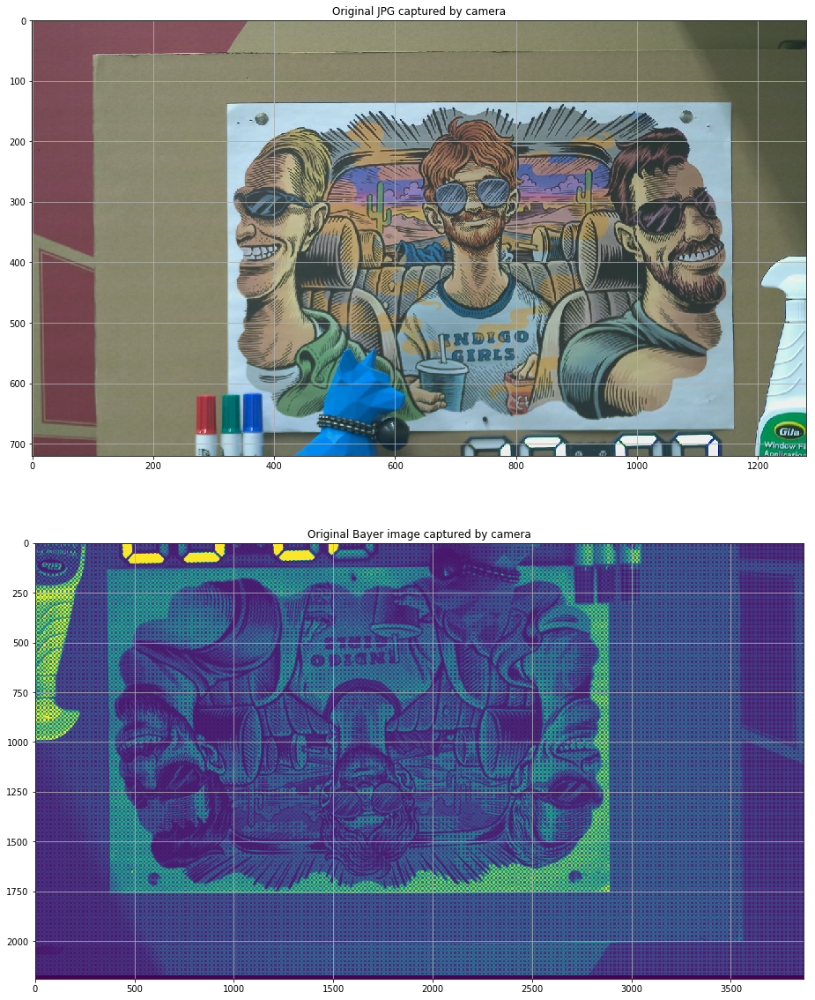

In [4]:
plt.figure(figsize=(20,20))
plt.subplot(2,1,1)
plt.imshow(orig_img)
plt.grid()
plt.title("Original JPG captured by camera")
plt.subplot(2,1,2)
plt.imshow(orig_bayer)
plt.grid()
plt.title("Original Bayer image captured by camera")
plt.show()

## Analyze Bayer

Now we can zoom in on the blue dog in the image to see that the blue coordinates in the bayer image have a strong signal.

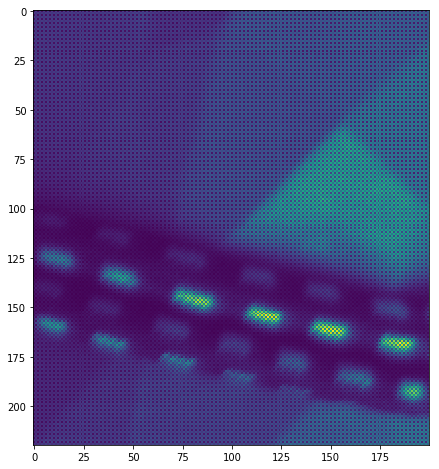

In [5]:
plt.figure(figsize=(8,8))
plt.imshow(orig_bayer[0:220,2200:2400])
plt.show()

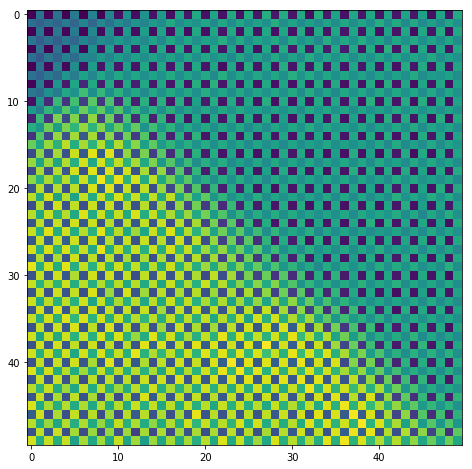

In [6]:
plt.figure(figsize=(8,8))
plt.imshow(orig_bayer[50:100,2350:2400])
plt.show()

From the above, we can see that the blue dog is made of blue and green components, but no red. Specifically, the dark black squares show that the red color is not present in this region but the lighter squares show green and blue are prevalent.

Now, to analyze the distributions of each color component in the bayer image we can isolate each color R,G1,B,G2 and plot histograms of their values.

/Users/nathaninkawhich/anaconda/envs/tensorflow_p36/lib/python3.6/site-packages/matplotlib/axes/_axes.py:6571: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


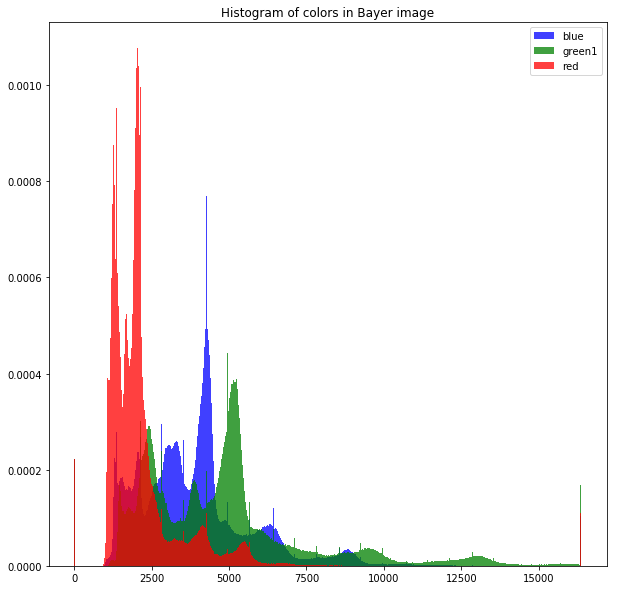

In [18]:
# Blue
blue = np.copy(orig_bayer[0::2,0::2])
# Green-1
green1 = np.copy(orig_bayer[0::2,1::2])
# Red
red = np.copy(orig_bayer[1::2,1::2])
# Green-2
green2 = np.copy(orig_bayer[1::2,0::2])


plt.figure(figsize=(10,10))
plt.hist(blue.flatten(),bins=500, color='blue',label='blue',alpha=0.75,normed=True)
plt.hist(green1.flatten(),bins=500, color='green',label='green1',alpha=0.75,normed=True)
plt.hist(red.flatten(),bins=500, color='red',label='red',alpha=0.75,normed=True)
#plt.hist(green2.flatten(),bins=500, color='black',label='green2',alpha=0.75,normed=True)
plt.title("Histogram of colors in Bayer image")
plt.legend()
plt.show()

/Users/nathaninkawhich/anaconda/envs/tensorflow_p36/lib/python3.6/site-packages/matplotlib/axes/_axes.py:6571: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


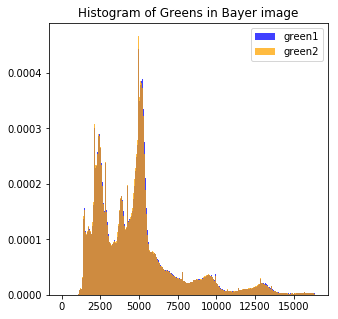

In [22]:
plt.figure(figsize=(5,5))
#plt.hist(blue.flatten(),bins=500, color='blue',label='blue',alpha=0.75,normed=True)
plt.hist(green1.flatten(),bins=500, color='blue',label='green1',alpha=0.75,normed=True)
#plt.hist(red.flatten(),bins=500, color='red',label='red',alpha=0.75,normed=True)
plt.hist(green2.flatten(),bins=500, color='orange',label='green2',alpha=0.75,normed=True)
plt.title("Histogram of Greens in Bayer image")
plt.legend()
plt.show()

The above plots tell us a few very important things:

1. From the top histogram, the green colors take on the largest values, followed by the blues, then the reds. Also, the distribution of the red values is highly concentrated at the low values, whereas the distributions of the green and blue values are more spread out.
2. From the bottom histogram, the green1 and green2 channels are almost identical. Knowing this, we may justify dropping the green2 channel in our algorithmic demosaicing function.

## Algorithmic Demosaicing

This section will show methods for algorithmically demosaicing bayer images. The ```demosaic``` function was given as a part of class code and will serve as a baseline. The ```ink_demosaic``` is my attempt and a demosaicing function. The procedure is as follows:

- Isolate R,G1,B,G2 channels from bayer image. Note, downscale G1 channel by 30% in attempt to mitigate green bias
- Assemble RGBG image
- Drop G2 channel as it contains much of the same information as G1
- Upsample in height and width by a factor of 2 and interpolate. Interpolation may be "nearest", "bilinear", or "cubic"
- Equalize the color histograms to mitigate green bias

In [55]:
def demosaic(rawImage):  
    red=rawImage[0:2160:2,0:3840:2]
    redU=interp.RectBivariateSpline(np.arange(0,1080),np.arange(0,1920),red)
    red=redU(np.arange(0,1080,.5),np.arange(0,1920,.5))
    blue=rawImage[1:2160:2,1:3840:2]
    blueU=interp.RectBivariateSpline(np.arange(0,1080),np.arange(0,1920),blue)
    blue=blueU(np.arange(0,1080,.5),np.arange(0,1920,.5))
    green=rawImage;
    for er in range(0,2159,2):
        for odr in range(0,3862,2):
            green[er,odr]=np.mean([green[er-1,odr], green[er,odr-1],green[er+1,odr], green[er,odr+1]])
    for er in range(1,2160,2):
        for odr in range(1,3862,2):
            green[er,odr]=np.mean([green[er-1,odr], green[er,odr-1],green[er+1,odr], green[er,odr+1]])
    greenU=interp.RectBivariateSpline(np.arange(0,2160),np.arange(0,3862),green[0:2160,0:3862])
    green=greenU(np.arange(0,2160,1),np.arange(0,3840,1))
    imageOut=np.dstack((red,green,blue))
    imageOut=255*imageOut/np.max(imageOut)
    imageOut=imageOut.astype(np.uint8)
    imageOut=skimage.transform.rotate(imageOut,180)
    return imageOut

def ink_demosaic(rawImage, order=1):
    """
    Expect the bayer image is of the form:
    
    B  G1 B  G1
    G2 R  G2 R
    B  G1 B  G1
    G2 R  G2 R
    """
    # Handle weird scaling of bayer image from camera. Scale to [0,1]
    rawImage=rawImage/np.max(rawImage)
    
    ### Step 1: Isolate R, G1, B, G2
    # Blue
    blue = np.copy(rawImage[0::2,0::2])
    # Green-1
    green1 = np.copy(rawImage[0::2,1::2])*0.7
    # Red
    red = np.copy(rawImage[1::2,1::2])
    # Green-2
    green2 = np.copy(rawImage[1::2,0::2])

    # Assemble RGBG image of shape CHW
    rgbg = np.array([red,green1,blue,green2])
    
    ### Step 2: Drop G2 channel. Intuitively, G2 contains much of the same information as G1 so we may not need it
    small_rgb = rgbg[0:3,:,:]
    
    ### Step 3: Upsample and interpolate by factor of 2 to get full scale image
    full_rgb = scipy.ndimage.zoom(np.copy(small_rgb), (1,2,2), order=order)
    full_rgb=skimage.transform.rotate(full_rgb,180)
    ### Step 4: Equalize histogram
    full_rgb = exposure.equalize_hist(full_rgb)

    return np.copy(np.clip(np.flip(np.array(full_rgb),axis=2), 0., 1.))
    

**Baseline demosaic function from given code**

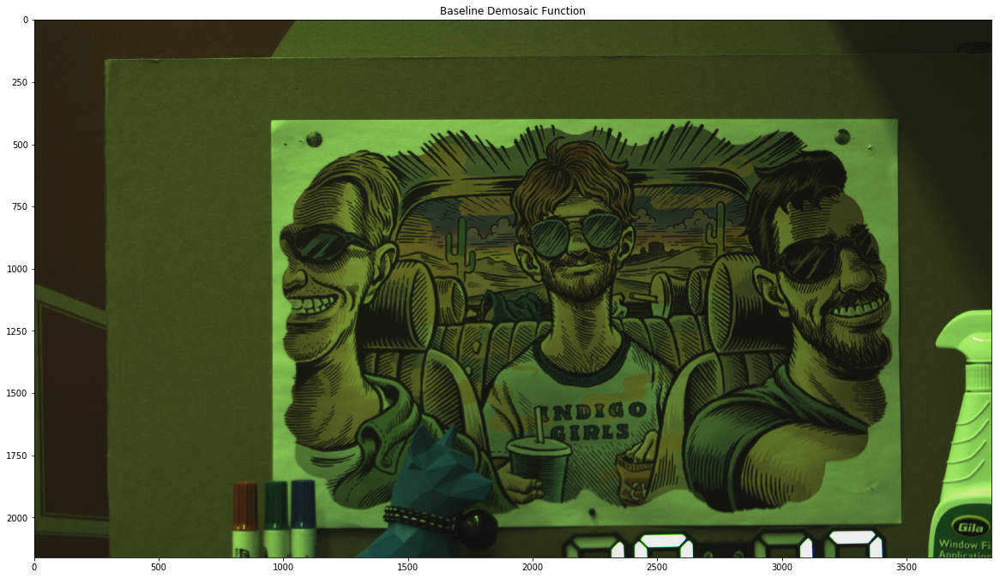

In [29]:
baseline_demosaic = demosaic(np.copy(orig_bayer))
plt.figure(figsize=(20,20))
plt.title("Baseline Demosaic Function")
plt.imshow(baseline_demosaic)

**My demosaic functions with 3 flavors of interpolation**

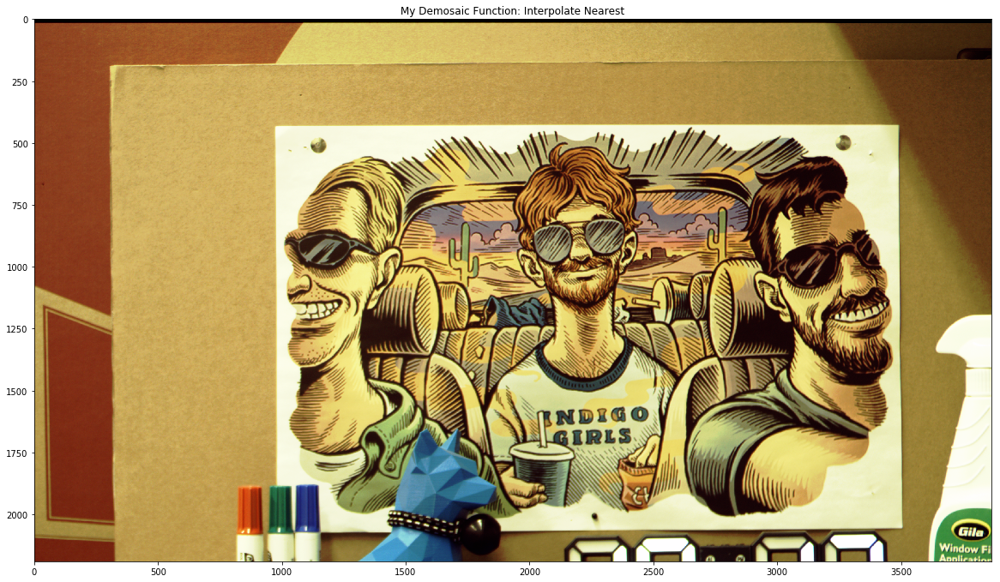

In [56]:
ink_demosaic_1 = ink_demosaic(np.copy(orig_bayer),order=1)
plt.figure(figsize=(20,20))
plt.title("My Demosaic Function: Interpolate Nearest")
plt.imshow(ink_demosaic_1.transpose(1,2,0))

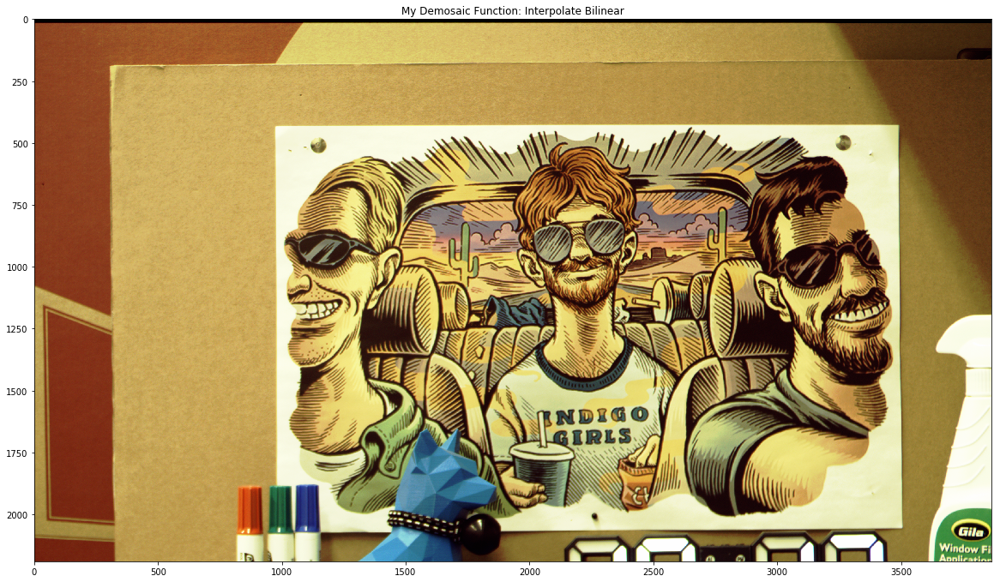

In [57]:
ink_demosaic_2 = ink_demosaic(np.copy(orig_bayer),order=2)
plt.figure(figsize=(20,20))
plt.title("My Demosaic Function: Interpolate Bilinear")
plt.imshow(ink_demosaic_2.transpose(1,2,0))

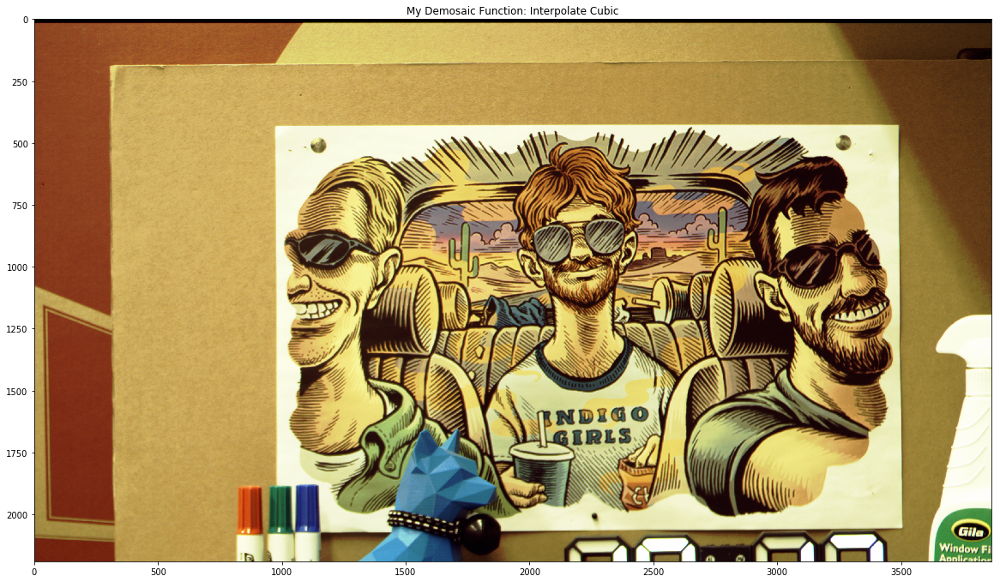

In [58]:
ink_demosaic_3 = ink_demosaic(np.copy(orig_bayer),order=3)
plt.figure(figsize=(20,20))
plt.title("My Demosaic Function: Interpolate Cubic")
plt.imshow(ink_demosaic_3.transpose(1,2,0))

From the above 4 images it appears the ```ink_demosaic``` creates more visually appealing images, and the interpolation function does not make a big difference. It is also worth noting that ```ink_demosaic``` is significantly faster than ```demosaic```.

## Deep Learning Demosaic

Now, we will demosaic with deep learning. Here, we assume the DNNTraining notebook was already run and the model was saved. To use that model here, first we will import and initialize it.

In [59]:
import keras
import keras.callbacks
from keras.preprocessing.image import ImageDataGenerator
from keras.models import Sequential
from keras.layers import Conv2D, MaxPooling2D, Conv2DTranspose, UpSampling2D
from keras.layers import Activation, Dropout, Flatten, Dense
import keras.optimizers as optimizers
from keras import backend as K
if K.backend()=='tensorflow':
    K.set_image_dim_ordering("th")

Using TensorFlow backend.


### Load DNN

In [60]:
# Define model architecture
def basic_model_v5():
    model = Sequential()
    # Nx4x32x32
    model.add(Conv2D(8, (3, 3), padding='same', input_shape=(4,32,32)))
    # Nx8x32x32
    model.add(Conv2D(16, (3, 3), padding='same'))
    # Nx16x32x32
    model.add(UpSampling2D((2, 2)))
    # Nx16x64x64
    model.add(Conv2D(3, (3, 3), padding='same'))
    # Nx3x64x64
    model.add(Activation('sigmoid'))
    # Define training functions
    adam = optimizers.Adam(lr=0.0001)
    model.compile(loss='mean_squared_error', optimizer=adam)
    return model

In [61]:
# Initialize model
cnn = basic_model_v5()
cnn.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_1 (Conv2D)            (None, 8, 32, 32)         296       
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 16, 32, 32)        1168      
_________________________________________________________________
up_sampling2d_1 (UpSampling2 (None, 16, 64, 64)        0         
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 3, 64, 64)         435       
_________________________________________________________________
activation_1 (Activation)    (None, 3, 64, 64)         0         
Total params: 1,899
Trainable params: 1,899
Non-trainable params: 0
_________________________________________________________________


In [62]:
# load pretrained weights
cnn.load_weights("./Model_v5_Weights.hdf5")

### Prepare Bayer image for use with DNN and forward pass all patches

With the model initialized, we now prepare the bayer image from the camera for use with the model. To do this, we:

- tile the bayer image by 64x64 patches
- convert each bayer patch to 4x32x32 RGBG patch

Then we will:
- forward pass all RGBG patches through DNN to get 3x64x64 predictions
- stitch all 3x64x64 predictions together to form full scale demosaiced image.

In [114]:
def bayer_to_downsampled_rgbg(bayer_img):
    # Blue
    red = np.copy(bayer_img[0::2,0::2])
    # Green-1
    green1 = np.copy(bayer_img[0::2,1::2])
    # Red
    blue = np.copy(bayer_img[1::2,1::2])
    # Green-2
    green2 = np.copy(bayer_img[1::2,0::2])
    return np.array([red,green1,blue,green2])

# Convert to [0,1]
full_bayer = np.copy(orig_bayer)/np.max(orig_bayer)

# Tile full bayer into 64x64 patches
bayer_tiles = np.array([np.copy(full_bayer[x:x+64,y:y+64]) for x in range(0,full_bayer.shape[0],64) for y in range(0,full_bayer.shape[1],64)])

# Convert each bayer patch to 4x32x32 rgbg image (for input to DNN)
small_rgbg_tiles = []
for i in range(len(bayer_tiles)):
    # Convert to rgbg
    tmp_rgbg = bayer_to_downsampled_rgbg(np.copy(bayer_tiles[i]))
    if tmp_rgbg.shape == (4,32,32):
        small_rgbg_tiles.append(np.copy(tmp_rgbg))
    

# Format for use with CNN
test_tiles = np.array(small_rgbg_tiles)
test_tiles = test_tiles.astype('float32')

print("Full bayer shape: ", full_bayer.shape)
print("bayer tiles shape: ", bayer_tiles.shape)
print("test_tiles shape: ", test_tiles.shape)
print("test tiles min/max: {}/{}".format(test_tiles.min(), test_tiles.max()))

Full bayer shape:  (2190, 3864)
bayer tiles shape:  (2135,)
test_tiles shape:  (2040, 4, 32, 32)
test tiles min/max: 0.0/1.0


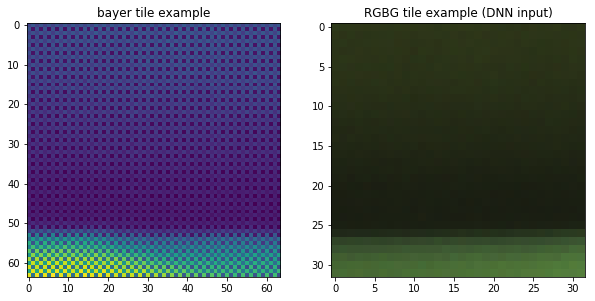

In [115]:
plt.figure(figsize=(10,10))
plt.subplot(1,2,1)
plt.imshow(bayer_tiles[100])
plt.title("bayer tile example")
plt.subplot(1,2,2)
plt.imshow(test_tiles[100][0:3,:,:].transpose(1,2,0))
plt.title("RGBG tile example (DNN input)")
plt.show()

**Forward pass all RGBG tiles and get predicted RGB**

In [116]:
preds = cnn.predict(test_tiles)

(2040, 3, 64, 64)


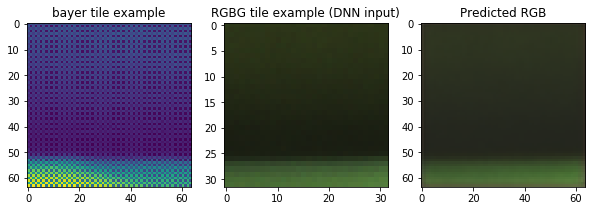

In [117]:
print(preds.shape)

plt.figure(figsize=(10,10))
plt.subplot(1,3,1)
plt.imshow(bayer_tiles[100])
plt.title("bayer tile example")
plt.subplot(1,3,2)
plt.imshow(test_tiles[100][0:3,:,:].transpose(1,2,0))
plt.title("RGBG tile example (DNN input)")
plt.subplot(1,3,3)
plt.imshow(preds[100].transpose(1,2,0))
plt.title("Predicted RGB")
plt.show()

### Stitch together output image

The last step is to stitch the predicted patches together to form the full scale demosaiced RGB image.

In [118]:
stitched_output = np.zeros((2190,3864,3))
print(stitched_output.shape)

cnt = 0
for x in range(0,2190-64,64):
    for y in range(0,3864-64,64):
        stitched_output[x:x+64,y:y+64,:] = np.copy(preds[cnt]).transpose(1,2,0)
        cnt += 1
        
print(stitched_output.max())
print(stitched_output.min())

(2190, 3864, 3)
0.9586697816848755
0.0


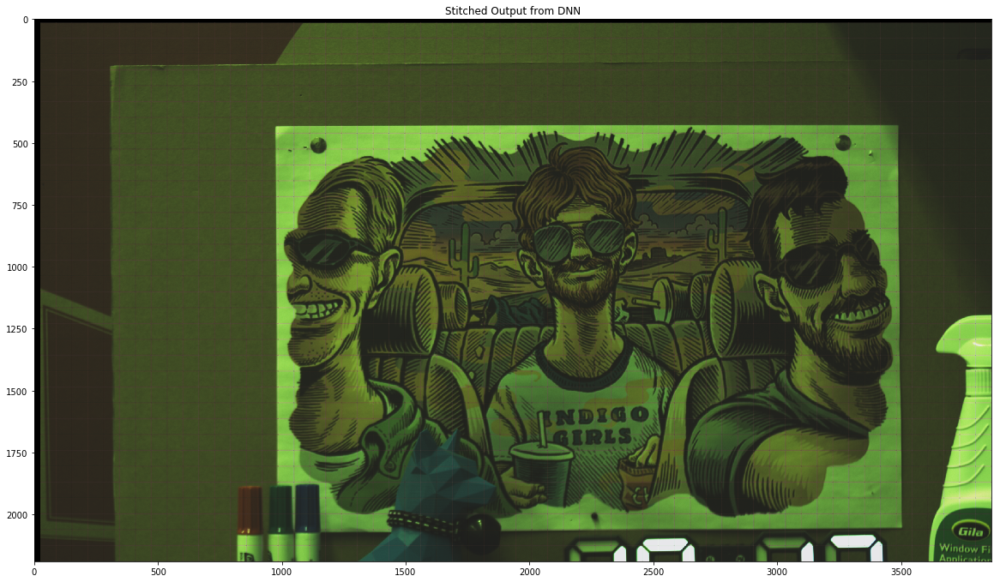

In [122]:
plt.figure(figsize=(20,20))
plt.title("Stitched Output from DNN")
plt.imshow(np.flip(np.flip(stitched_output,axis=0),axis=1))

Again, we notice a green bias. Finally, we can attempt to mitigate this bias by performing histogram equalization.

/Users/nathaninkawhich/anaconda/envs/tensorflow_p36/lib/python3.6/site-packages/skimage/exposure/exposure.py:63: UserWarning: This might be a color image. The histogram will be computed on the flattened image. You can instead apply this function to each color channel.
  warn("This might be a color image. The histogram will be "


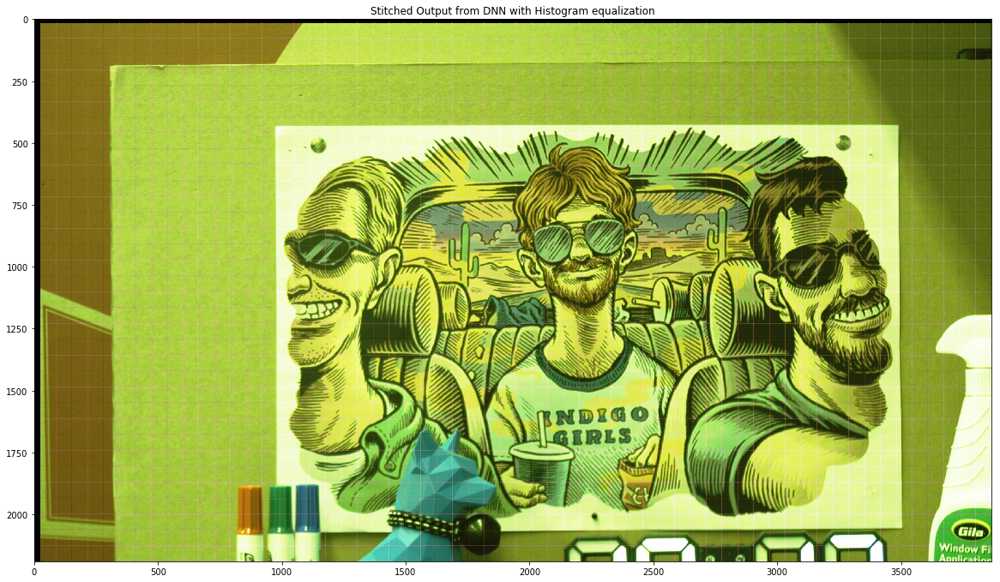

In [123]:
plt.figure(figsize=(20,20))
plt.title("Stitched Output from DNN with Histogram equalization")
plt.imshow(exposure.equalize_hist(np.flip(np.flip(stitched_output,axis=0),axis=1)))

FINALLY, WE ARE DONE! The stitched image looks reasonable and the DNN did a good job of demosaicing the patches. With more advanced postprocessing the green bias may be mitigated further.